# Simple Effects With Batch Streams

The examples below take us one step further into signal processing, by making a more dynamical and parameterized changes using the `batch` processing mode.



NOTE: These examples might take a few minutes to run. Fortunately, you are able to listen to previously rendered results at each step of this notebook.

#### Import _quantumaudio_ and necessary _tools_

In [1]:
# Set path for local use of the repository
import os
import sys
sys.path.insert(0, os.path.dirname(os.getcwd()))

In [2]:
import quantumaudio

In [3]:
from tools.audio import read, write
from tools.interactive import play, compare_audio
from tqdm import tqdm
import numpy as np
import matplotlib.pyplot as plt

## Example 1: Geiger Conter Effect

The batch mode allows us to make operations that are time-dependent, which gives us the possibility of creating variation and dynamics. One simple idea of articulation that one could think is to simply vary the number of shots of the experiment - trying to listen to how the audio gets reconstructed. 
This audification example may resemble the ticks of a geiger counter. In a way, each measurement of the quantum circuit could be aesthetically correlated with a detection of a specific quantum state configuration - which is the reason that is was nicknamed as _geiger counter effect_.

It is computationally expensive to run such larger effects (with results in the audible range) from a laptop. To be able to efficiently replicate this effect in this notebook with audible results, we need to decrease the resolution (the sampling rate in this case) of the signal)

Note: this effect was originally build with wavetable synthesis, as described [here](https://researchportal.plymouth.ac.uk/en/studentTheses/towards-quantum-computing-for-audio-and-music-expression).

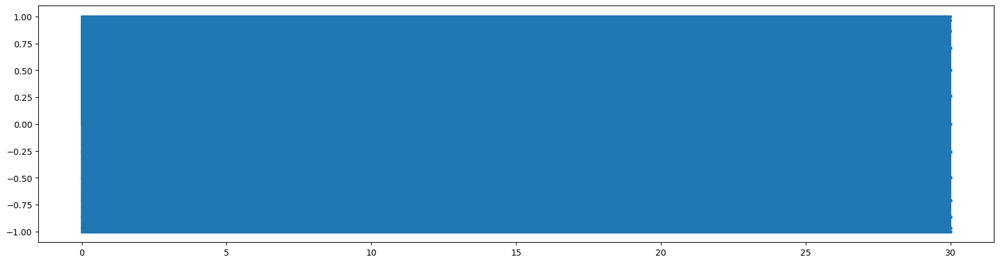

In [4]:
frequency = 200 #Hz
duration = 30 #seconds
sampling_rate = 4800 #Hz

size = duration*sampling_rate
t = np.linspace(0, duration-duration/size, size)
puretone_geiger = np.sin(2*np.pi*frequency*t)
plt.figure(figsize=(20,5))
plt.plot(t, puretone_geiger, '.-', ms=5)
plt.show()

In [5]:
play(puretone_geiger, rate=sampling_rate)

Since we designed a sound in which a period has exactly 240 samples (`sampling_rate/frequency`), we can choose the chunk size of our problem to be a multiple of 240.

Chunk Size: 2400 |  Total number of Chunks: 60.0


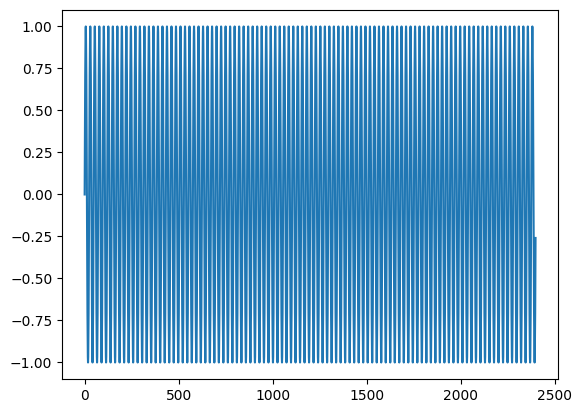

In [6]:
# One chunk of the audio containing 100 periods. Test with different numbers!
chunk_size = int(sampling_rate/frequency*100)
# chunk_size = sampling_rate/frequency
num_of_chunks = size/chunk_size
print(f'Chunk Size: {chunk_size} |  Total number of Chunks: {num_of_chunks}')
plt.plot(puretone_geiger[:int(chunk_size)])
plt.show()

Now we design our batch processing routine. Notice that the initial argument `chunks` will be the list containing all the audio chunks. As a result, it is possible to create processing algorithms that depend on the index of the chunk - in other words, the position in the audio.

In [7]:
# To see more arguments available to you in the batch processing, uncomment the line below:
# help(quantumaudio.tools.stream_data)

In [8]:
def batch_proc_ex1(chunks, scheme, backend=None):
    output = []
    
    SHOTS =[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 200, 300, 400, 500, 1000, 2000, 3000, 4000, 5000, 10000, 20000, 100000]
    for i, chunk in enumerate(tqdm(chunks)):
        # encode
        circuit = scheme.encode(chunk, verbose=0, measure=False)
        
        # No processing will be applied, this is essentially a bypass circuit

        # Instead, we will control the number of shots
        shots= SHOTS[i//2] # change the number of shots every two chunks
        # decode
        output.append(scheme.decode(circuit, backend=backend, shots=shots))
    return output

To submit the job, all you need is to call the `stream` method, and set the argument ```batch_process=True```

In [9]:
# Run it yourself
y_out = quantumaudio.stream(puretone_geiger, scheme='qpam', chunk_size=chunk_size, process_function=batch_proc_ex1, batch_process=True)

Quantum Probability Amplitude Modulation

Shape: (144000,)
Num samples: 144000, Num channels: 1, Buffer size: 2400
Number of chunks: 60
Shape per buffer: (1, 2400)

Number of qubits required: 12

12 qubits for time
0 qubits for amplitude


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 60/60 [00:04<00:00, 12.27it/s]


In [10]:
play(y_out,rate=sampling_rate)

Listen to a previous runs 

In [11]:
# Chunk size == 24000
compare_audio('media/Ex1_Puretone_200_4800_30.wav', "media/Ex1_Puretone_geiger_2400.wav")

In [12]:
# Chunk size == 2400
compare_audio('media/Ex1_Puretone_200_4800_30.wav', "media/Ex1_Puretone_geiger_240.wav")

In [13]:
# Chunk size == 240
compare_audio('media/Ex1_Puretone_200_4800_30.wav', "media/Ex1_Puretone_geiger_24.wav")

Notice how the sound comes from a set of rhythmic clicks, to a dense noise, and finally the original signal that was encoded.

## Example 2 - Dinamically rotating the channel register
Expanding from the demonstration on the previous notebook, we can use the batch processing mode to attenpt to listen to what happens when you slowly _rotate_ the channel qubit of a multi-channel encoding scheme, instead of just fliiping the channels:

#### Load a Stereo Audio

In [14]:
path = "media/Ignacio_short.mp3"
y, sr = read(path,mono=False)
play(y, rate=sr)

In [15]:
def batch_proc_ex2(chunks, scheme, backend=None):
    output = []
    chunks_size = len(chunks)
    
    for i, chunk in enumerate(tqdm(chunks)):
        # encode
        circuit = scheme.encode(chunk, verbose=0, measure=False)
        channel_qubit_index = circuit.metadata["qubit_shape"][0] + 1 #channel qubit follows index qubit

        # Slowly change the probability of measuring the right channel
        circuit.ry((i/chunks_size)*np.pi,channel_qubit_index)

        # decode
        shots=10000 #Remember that shots==0 returns an error!

        output.append(scheme.decode(circuit, backend=backend, shots=shots))    # encode
    
    return output

#### Perform Batch processing (warning: this may take a while time to run)

In [ ]:
# Run it yourself, test with different chunk sizes
y_out = quantumaudio.stream(y, chunk_size=64, process_function=batch_proc_ex2, batch_process=True)

#### Play the Output Audio

In [470]:
play(y_out,rate=sr)

In [16]:
# Load a previously rendered result:
compare_audio("media/Ignacio_short.mp3", 'media/Ex2_Ignacio_channel_rotated.wav')

# SQPAM Ry Rotations

In this next example, the idea is to try to rotate the amplitude qubit around the block sphere at small increments each time. 
We will craft a small example using a pure sinewave.

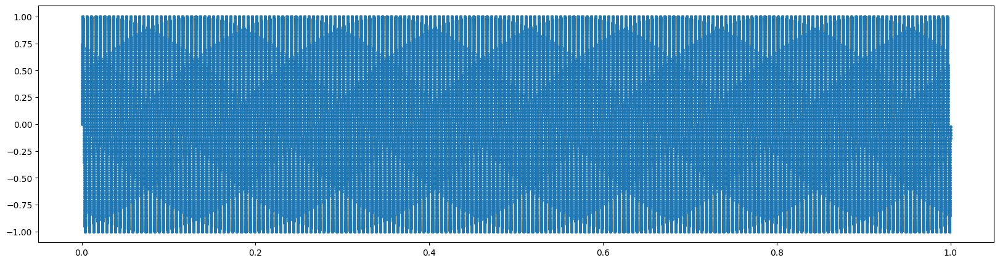

In [17]:
# Creating a pure tone
frequency = 200 #Hz
duration = 1 #seconds
sampling_rate = 48000 #Hz

size = duration*sampling_rate
t = np.linspace(0, 1-1/size, size)
puretone = np.sin(2*np.pi*frequency*t)
plt.figure(figsize=(20,5))
plt.plot(t, puretone, '.-', ms=5)
plt.show()

The general idea in this exercise is again to try to design the audio in a way that an audio chunk will encompass exactly one period of our wave. If we know the frequency and the audio's sampling rate, we are able to calculate what is the chunk size that would contain a full period:

Chunk Size: 240.0 |  Total number of Chunks: 60.0


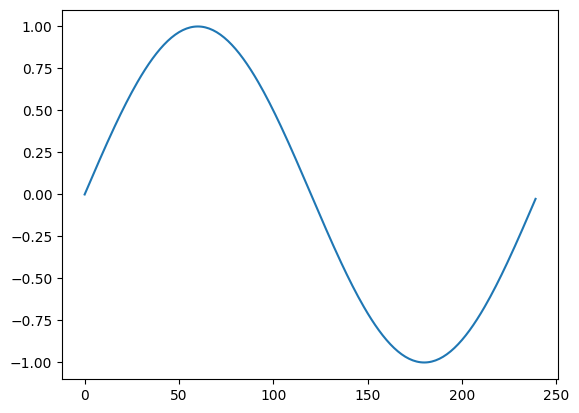

In [18]:
chunk_size = sampling_rate/frequency
print(f'Chunk Size: {chunk_size} |  Total number of Chunks: {num_of_chunks}')
plt.plot(puretone[:int(chunk_size)])
plt.show()

Now, let us encode this signal using SQPAM, and try to run a simple processing: What is the audible result of applying a Ry rotation to the qubit that is encoding all amplitudes?

In [19]:
def batch_proc_ex3(chunks, scheme, backend=None):
    output = []
    for i, chunk in enumerate(tqdm(chunks)):
        # encode
        circuit = scheme.encode(chunk, verbose=0, measure=False)
        amplitude_qubit_index = circuit.metadata["qubit_shape"][1] #channel qubit follows index qubit

        # Apply an increment to the rotation, every 100 chunks
        circuit.ry((i//6)*np.pi/10, amplitude_qubit_index)
        
        shots=8000
        # decode
        output.append(scheme.decode(circuit, backend=backend, shots=shots))
    return output

#### Perform Batch processing (warning: this may take a long time to run)

In [ ]:
# Run it yourself
y_out = quantumaudio.stream(puretone, scheme='sqpam', chunk_size=240, process_function=batch_proc_ex3, batch_process=True)

In [ ]:
play(y_out,rate=sampling_rate)

In [20]:
# Load a previously rendered result:
compare_audio("media/Ex3_Puretone_200_48000_1.wav", 'media/Ex3_Puretone_sqpam_ry.wav')

### "Amplitude Modulation for Amplitude Modulation"

Depending on the input and batch sizes, it is possible to use the ticks in the audio to perform (classic) amplitude modulation in another signal. 

For demosntration purposes, let us design an amplitude modulation calculation from the Geiger Counter Effect using the Quantum Probability Amplitude Modulation scheme. To achieve this, let us create two signals: A modulation and a carrier signal.

In [21]:
frequency = 200 #Hz
frequency_1 = 2000 #Hz
duration = 0.03 #seconds
sampling_rate = 48000 #Hz

SHOTS =[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 200, 300, 400, 500, 1000, 2000, 3000, 4000, 5000, 10000, 20000, 100000]

#Modulation Signal
size = duration*sampling_rate
t = np.linspace(0, duration-duration/size, int(size))
geiger_mod = np.sin(2*np.pi*frequency_1*t)

#Carrier Signal
car_duration = 1000*duration
car_size = car_duration*sampling_rate
car_t = np.linspace(0, car_duration-car_duration/car_size, int(car_size))
carrier_signal = np.sin(2*np.pi*frequency*car_t) + np.sin(2*np.pi*1.5*frequency*car_t) + np.sin(2*np.pi*3*frequency*car_t) +np.sin(2*np.pi*5*frequency*car_t)


Then, let us proceed with performing a _Geiger Counter Effect_ in the modulation signal

24 60.0


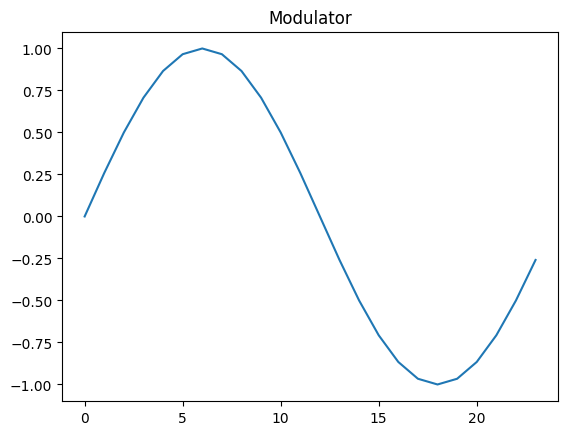

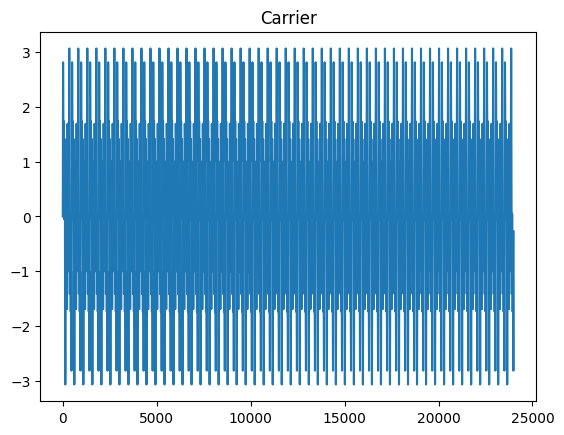

In [22]:
chunk_size = 24
# chunk_size = sampling_rate/frequency
num_of_chunks = size/chunk_size
print(chunk_size, num_of_chunks)



plt.plot(geiger_mod[:int(chunk_size)])
plt.title('Modulator')
plt.show()
plt.plot(carrier_signal[:1000*int(chunk_size)])
plt.title('Carrier')
plt.show()

We can perform a (naive) classical amplitude modulation. In this case, the block size of the modulation is 1000. In other words, one sample of the modutator will multiply 1000 samples of the carrier signal (note that this simple approach will generate some artifacts due to the sharp jumps between blocks):

In [23]:
print(len(geiger_mod), len(carrier_signal))

1440 1440000


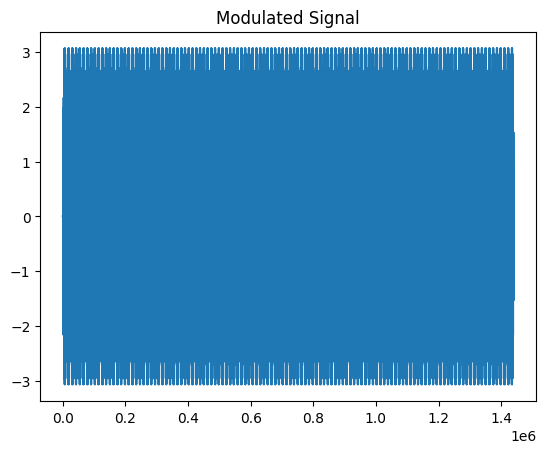

In [24]:
normal_am = np.repeat(geiger_mod, 1000)*carrier_signal
plt.plot(normal_am)
plt.title('Modulated Signal')
plt.show()

In [25]:
play(normal_am,rate=sampling_rate)

In [26]:
def batch_proc_ex4(chunks, scheme, backend=None):
    output = []
    SHOTS =[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 200, 300, 400, 500, 1000, 2000, 3000, 4000, 5000, 10000, 20000, 100000]
    number_of_chunks = len(chunks)
    car_chunk_size = int(car_size/number_of_chunks)
    for i, chunk in enumerate(tqdm(chunks)):
        # encode
        circuit = scheme.encode(chunk, verbose=0, measure=False)
        
        # No processing will be applied, this is essentially a bypass circuit

        # Instead, we will control the number of shots
        shots= SHOTS[i//2]
        # decode
        processed_chunk = scheme.decode(circuit, backend=backend, shots=shots)
        
        # Sometimes it may be useful to apply the amplitude modulation (or any other post-processing) inside the batch:
        # output.append(np.repeat(processed_chunk+1,1000)*carrier_signal[i*car_chunk_size:(i+1)*car_chunk_size])
        
        output.append(processed_chunk)
    return output

In [27]:
# Run it yourself
y_out = quantumaudio.stream(geiger_mod, scheme='qpam', chunk_size=chunk_size, process_function=batch_proc_ex4, batch_process=True)


Shape: (1440,)
Num samples: 1440, Num channels: 1, Buffer size: 24
Number of chunks: 60
Shape per buffer: (1, 24)

Number of qubits required: 5

5 qubits for time
0 qubits for amplitude


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 60/60 [00:00<00:00, 120.10it/s]


Apply the Amplitude Modulation to the carrier signal. Note that we are shifting the carrier signal to the positive domain (`y_out + 1`)

In [28]:
geiger_am = np.repeat(y_out+1, 1000)*carrier_signal

In [29]:
play(geiger_am,rate=sampling_rate)

In [30]:
# Load a previously rendered result:
compare_audio("media/Ex4_AM.wav", 'media/Ex4_QPAM_AM.wav')